<a href="https://colab.research.google.com/github/meera998/Netflix_DataAnalysis/blob/main/Netflix_DataAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A surface analysis of Netflix's Dataset

Through this project, we will be analyzing the [Netflix Movies and TV Shows ](http://https://www.kaggle.com/datasets/shivamb/netflix-shows) dataset to identify: 

* **A snapshot:**
> * Distribution of types of movies and series </br>
> * Distribution of genres </br>
> * Distribution of maturity ratings </br>
> * Movies/series added per month per year </br>
> * Top performing directors</br>
* **Countries with highest number of movie/series production**
* **The top 5 actors by the number of times they performed in a movies/series**
* **What are the top genres in each country?**
* **List of the movies that have "happy" in their descriptions**
* **Top three genres by their accumulated durations**
* **Which movies has the longest duration**
* **List 5 longest movies and series**
* **Which series has the highest number of seasons**
* **Count the number of movies and TV series for each year**
* **Which movies has the longest duration**
* **List 3 movies and TV series which have the highest number of cast**
* **Show the total number of ,movies and TV series in each country**
* **Count the movies which relate to magic,animal,history,games and marin**







### importing libraries 

In [55]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

%matplotlib inline

### importing CSV file

In [56]:
NT_df=pd.read_csv("https://raw.githubusercontent.com/meera998/Netflix_DataAnalysis/main/Source_Code/netflix_titles.csv")

##First of all we will be working on ***data cleaning*** so we can have an accurate Data Analysis

###1. Handling duplicated data 

In [57]:
NT_df.nunique()

show_id         8807
type               2
title           8807
director        4528
cast            7692
country          748
date_added      1767
release_year      74
rating            17
duration         220
listed_in        514
description     8775
dtype: int64

In [58]:
#here we show all the duplicated data regarding 'description', to examine how to deal with it. 
#duplicated_data= NT_df.loc[NT_df.duplicated(subset=["description","type"], keep=False), :]
#duplicated_data.sort_values("description", ascending=True, inplace=True)

#first we change all the empty data to NaN
NT_df = NT_df.replace("", np.nan)

#then we sort the data based on the added_date to keep the latest record 
NT_df.sort_values("date_added", ascending=True, inplace=True)
NT_df.drop_duplicates(subset=["description"], keep="last", inplace=True)
NT_clean= NT_df.sort_values(by=["description"], ascending=True)

In [59]:
# checking abnormal duplication
NT_clean.nunique()

show_id         8775
type               2
title           8775
director        4526
cast            7685
country          747
date_added      1766
release_year      74
rating            17
duration         220
listed_in        514
description     8775
dtype: int64

### 2. Handling null values

In [60]:
#here we figure out how many null values we have for each observations 
NT_df.isnull().sum()

show_id            0
type               0
title              0
director        2628
cast             822
country          822
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

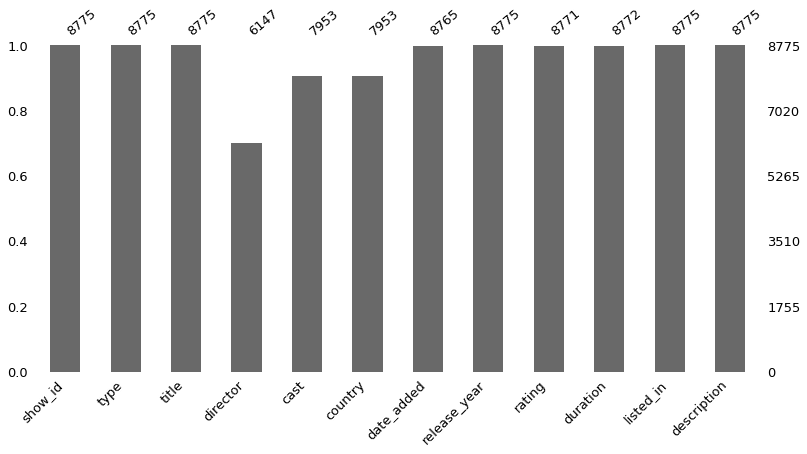

In [61]:
#we use bar chart to visulaize and understand the null values for each observations 
msno.bar(NT_clean, figsize=(13,6), fontsize=13);
plt.xticks(rotation=40);

as we can see above most of the missing values fall under **director, cast** and **country** columns.

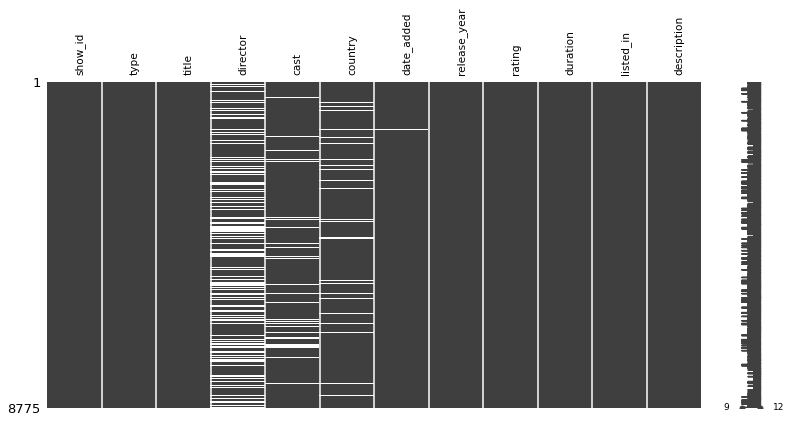

In [62]:
#The below graph give us positional information of the missing values, and how the missing values are disrtibuted over the dataset
msno.matrix(NT_clean, figsize=(13,6), fontsize=10.5);
plt.xticks(rotation=90);

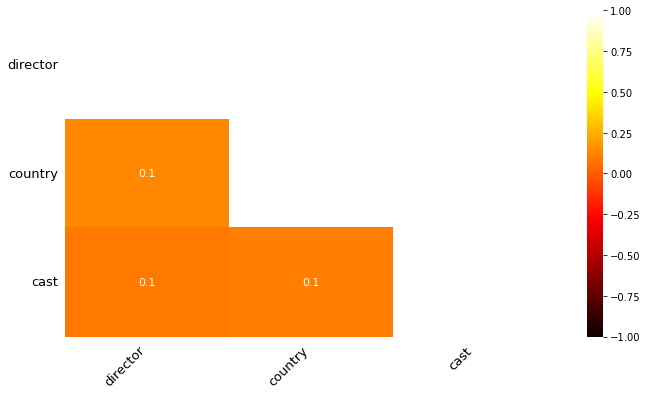

In [63]:
# the below heatmap reveals that how the missing data are related 
msno.heatmap(NT_clean[["director","country","cast"]], figsize=(11,6), fontsize=13, cmap="hot");

the above heatmap shows how the missing values are realted, as we can see the values are Missing Completely at Random (**MCAR**) which means there is not any correlation between the values. Therefore, based on these hypothesis we will fill the missing values as bellow:


*   changing the values in **director**, **country** and **cast** to *UNKNOWN*.
*   sorting the generes and filling these **rating** null values with either the previous record or the next record.
*filling **duration** and **date_added** by taking median.



In [64]:
#the duration has been entered incorrectly in place of rating, therefore, before dealing with null values we will fix this problem
null_values=NT_clean.loc[NT_df.duration.isnull(), :] 
null_values

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
5794,s5795,Movie,Louis C.K.: Hilarious,Louis C.K.,Louis C.K.,United States,"September 16, 2016",2010,84 min,NaN,Movies,Emmy-winning comedy writer Louis C.K. brings h...
5541,s5542,Movie,Louis C.K. 2017,Louis C.K.,Louis C.K.,United States,"April 4, 2017",2017,74 min,NaN,Movies,"Louis C.K. muses on religion, eternal love, gi..."
5813,s5814,Movie,Louis C.K.: Live at the Comedy Store,Louis C.K.,Louis C.K.,United States,"August 15, 2016",2015,66 min,NaN,Movies,The comic puts his trademark hilarious/thought...


before fixing this problem we will check if there is similar error

In [65]:
NT_clean.rating.unique()

array(['TV-14', 'TV-MA', 'R', 'TV-PG', 'NR', 'TV-Y', 'TV-G', 'PG',
       'PG-13', 'TV-Y7', 'UR', 'G', nan, 'NC-17', 'TV-Y7-FV', '84 min',
       '74 min', '66 min'], dtype=object)

In [66]:
#here we will count the number of occurance for the specified values 
a=NT_clean['rating'].where(NT_clean['rating'] == "74 min").count()
b=NT_clean['rating'].where(NT_clean['rating'] == "84 min").count()
c=NT_clean['rating'].where(NT_clean['rating'] == "66 min").count()

print(f'number of occurance is: {a+b+c}')

number of occurance is: 3


In [67]:
NT_clean.at[5541,"rating"]= np.nan
NT_clean.at[5541,"duration"]= "74 min"
NT_clean.at[5794,"rating"]= np.nan
NT_clean.at[5794,"duration"]= "84 min"
NT_clean.at[5813,"rating"]= np.nan
NT_clean.at[5813,"duration"]= "66 min"

as we can observe above we swaped the values for **rating** and **duration** so we can later on fill the null values proparly without any mistakes

In [68]:
'''here we replace all the null values in country, director and cast  to unknown because 
all of them are independable '''
NT_clean.director.replace(np.nan, "UNKNOWN", inplace=True)
NT_clean.country.replace(np.nan, "UNKNOWN", inplace=True)
NT_clean.cast.replace(np.nan, "UNKNOWN", inplace=True)

# for the rating we first sort the generes, and then use ffill method to fill the null values
NT_clean=NT_clean.sort_values(by=["listed_in"], ascending=True)
NT_clean["rating"].fillna(method="ffill", inplace=True)

# for the date_added we specify the median, but we should first convert date_added which is string to date time
NT_clean["date_added"]= pd.to_datetime(NT_clean['date_added'])
NT_clean["date_added"].fillna(NT_clean["date_added"].mode()[0], inplace=True)

# for the duration also we will use median to fill the null values 
NT_clean["duration"].fillna(NT_clean["duration"].mode()[0], inplace=True)

In [69]:
#checking wether null values are remaning or not
NT_clean.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

Now as we can see we our work with dealing with null values

###3. Fixing structual issues
in this part we will be doing some actions including: 



* Removing and normalizing the column data types.
* Fixing naming conventions and checking misspeling
* Fixing units or metrics (e.g., hour, minute, etc.)
* Double checking improper capitalizations
* Removing/replacing special characters



####**Fixing naming conventions** 




here we will rename some of the columns and make it more specific and standard, and check if there is any misspelings

In [70]:
NT_clean.rename(columns = {"listed_in":"genres","rating":"maturity_rating","description":"storyline"}, inplace = True)  

In [71]:
NT_clean.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'maturity_rating', 'duration', 'genres', 'storyline'],
      dtype='object')

now we have more proper and specific columns 


<hr>

####**Removing/replacing special characters** 
here we will remove all the special characters which is not normal to be in the text

In [72]:
#we will remove all the special characters in the columns except what is specified in the bracket in (to_replace) parameter
NT_clean['storyline'].replace(regex=True, inplace=True, to_replace=r"[^a-zA-Z0-9.,'’-]", value=r' ')
NT_clean['genres'].replace(regex=True, inplace=True, to_replace=r"[^a-zA-Z.,&]", value=r' ')
NT_clean['duration'].replace(regex=True, inplace=True, to_replace=r"[^a-zA-Z0-9]", value=r' ')
NT_clean['maturity_rating'].replace(regex=True, inplace=True, to_replace=r"[^a-zA-Z0-9-]", value=r' ')
NT_clean["country"].replace(regex=True, inplace=True, to_replace=r"[^a-zA-z,]", value=r' ')
NT_clean["cast"].replace(regex=True, inplace=True, to_replace=r"[^a-zA-z,.-]", value=r' ')
NT_clean["type"].replace(regex=True, inplace=True, to_replace=r"[^a-zA-z]", value=r' ')
NT_clean["show_id"].replace(regex=True, inplace=True, to_replace=r"[^a-zA-z0-9]", value=r' ')

####**Fixing units or metrics (e.g., hour, minute, etc.)**
now we will be dealing with units, for our scenario we will split movies and TV shows duration and convert them into numeric values as later on for our analysis we can work on them seperately 

In [73]:
#first we create a new column and put only the movies duration and exclude the TV shows duration
NT_clean["movie_duration_minute"]=NT_clean["duration"].where(NT_clean["type"]=="Movie")
#then we remove any string in the column
NT_clean["movie_duration_minute"].replace(regex=True, inplace=True, to_replace=r"[^0-9]", value=r' ')
#in the code below we replace all the null values with zero to show that the TV shows do not have duration
NT_clean["movie_duration_minute"].replace(np.nan, 0, inplace=True)
#here we convert the column from object to integer 
NT_clean["movie_duration_minute"]=pd.to_numeric(NT_clean["movie_duration_minute"], downcast="integer")
#NT_clean["movie_duration_minute"] = NT_clean["movie_duration_minute"].astype('int')

#checking the data type
NT_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8775 entries, 8354 to 122
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   show_id                8775 non-null   object        
 1   type                   8775 non-null   object        
 2   title                  8775 non-null   object        
 3   director               8775 non-null   object        
 4   cast                   8775 non-null   object        
 5   country                8775 non-null   object        
 6   date_added             8775 non-null   datetime64[ns]
 7   release_year           8775 non-null   int64         
 8   maturity_rating        8775 non-null   object        
 9   duration               8775 non-null   object        
 10  genres                 8775 non-null   object        
 11  storyline              8775 non-null   object        
 12  movie_duration_minute  8775 non-null   int16         
dtypes

In [74]:
#here we will do the same and create a new column and put only the movies duration and exclude the TV shows duration
NT_clean["number_of_seasons"]=NT_clean["duration"].where(NT_clean["type"]=="TV Show")
#then we remove any string in the column
NT_clean["number_of_seasons"].replace(regex=True, inplace=True, to_replace=r"[^0-9]", value=r' ')
#in the code below we replace all the null values with zero to show that the TV shows do not have duration
NT_clean["number_of_seasons"].replace(np.nan, 0, inplace=True)
#here we convert the column from object to integer 
NT_clean["number_of_seasons"]=pd.to_numeric(NT_clean["number_of_seasons"], downcast="integer")
#NT_clean["movie_duration_minute"] = NT_clean["movie_duration_minute"].astype('int')

#checking the data type
NT_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8775 entries, 8354 to 122
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   show_id                8775 non-null   object        
 1   type                   8775 non-null   object        
 2   title                  8775 non-null   object        
 3   director               8775 non-null   object        
 4   cast                   8775 non-null   object        
 5   country                8775 non-null   object        
 6   date_added             8775 non-null   datetime64[ns]
 7   release_year           8775 non-null   int64         
 8   maturity_rating        8775 non-null   object        
 9   duration               8775 non-null   object        
 10  genres                 8775 non-null   object        
 11  storyline              8775 non-null   object        
 12  movie_duration_minute  8775 non-null   int16         
 13  n

####Checking cast column
here we check the cast column, and search for logical error. For instance, it is not logical to have one member in the cast, so we have to tackle this problem.
 

In [86]:
pd.set_option('display.max_rows', None)
NT_clean.loc[(NT_clean["cast"].str.len()<24) & (NT_clean['cast'] != "UNKNOWN") ]

,show_id,type,title,director,cast,country,date_added,release_year,maturity_rating,duration,genres,storyline,movie_duration_minute,number_of_seasons
6428,s6429,Movie,Casino Tycoon,Wong Jing,Wong Jing,Hong Kong,2018-08-01,1992,TV-MA,125 min,"Action & Adventure, Dramas, International Movies","When Japanese troops invade Hong Kong, young B...",125,0
6429,s6430,Movie,Casino Tycoon 2,Wong Jing,Dennis Chan,Hong Kong,2018-08-16,1992,TV-MA,108 min,"Action & Adventure, Dramas, International Movies",Casino mogul Benny Ho wields enormous power. B...,108,0
8231,s8232,Movie,The Bund,UNKNOWN,Chow Yun Fat,Hong Kong,2018-09-20,1983,TV-14,103 min,"Action & Adventure, Dramas, International Movies","After losing everything, a young man rebuilds ...",103,0
6077,s6078,Movie,Abdo Mota,UNKNOWN,Mohamed Ramadan,Egypt,2019-04-19,2012,TV-MA,100 min,"Action & Adventure, Dramas, International Movies","Following the mysterious death of his parents,...",100,0
5190,s5191,Movie,The Bittersweet,D Ho,"Min-ho Lee, Zhu Xuan",China,2017-11-01,2017,TV-MA,98 min,"Action & Adventure, Dramas, International Movies","As a killer stalks the streets, a troubled you...",98,0
5812,s5813,TV Show,Caught on Camera,UNKNOWN,Nick Wallis,United Kingdom,2016-08-15,2015,TV-MA,3 Seasons,"British TV Shows, Crime TV Shows, Docuseries","Nick Wallis presents crimes caught on CCTV, ce...",0,3
5806,s5807,TV Show,Witches: A Century of Murder,UNKNOWN,Suzannah Lipscomb,United Kingdom,2016-09-01,2015,TV-14,1 Season,"British TV Shows, Crime TV Shows, Docuseries",Historian Suzannah Lipscomb investigates the w...,0,1
1427,s1428,TV Show,Inside the World’s Toughest Prisons,UNKNOWN,Paul Connolly,United Kingdom,2021-01-08,2021,TV-MA,5 Seasons,"British TV Shows, Crime TV Shows, Docuseries",Investigative journalist Paul Connolly becomes...,0,5
6695,s6696,TV Show,Encounters with Evil,UNKNOWN,Richard Lintern,United Kingdom,2019-07-12,2016,TV-14,1 Season,"British TV Shows, Crime TV Shows, Docuseries",This documentary series tries to get at the ro...,0,1
6930,s6931,TV Show,Harold Shipman - Driven to Kill,UNKNOWN,Harold Shipman,United Kingdom,2019-02-01,2014,TV-14,1 Season,"British TV Shows, Crime TV Shows, Docuseries",Interviews and dramatic reconstructions illumi...,0,1


In [76]:
#this is for test only!
test=NT_clean.copy()

In [79]:
test

,show_id,type,title,director,cast,country,date_added,release_year,maturity_rating,duration,genres,storyline,movie_duration_minute,number_of_seasons
8354,s8355,Movie,The Hurricane Heist,Rob Cohen,"Toby Kebbell, Maggie Grace, Ryan Kwanten, Ralp...","United Kingdom, United States",2018-09-26,2018,PG-13,103 min,Action & Adventure,A deadly hurricane with mile-high waves provid...,103,0
7197,s7198,Movie,Kill Bill: Vol. 1,Quentin Tarantino,"Uma Thurman, Lucy Liu, Vivica A. Fox, Daryl Ha...","United States, Japan",2020-01-01,2003,R,111 min,Action & Adventure,"An assassin is shot by her ruthless employer, ...",111,0
7963,s7964,Movie,Seal Team Six: The Raid on Osama Bin Laden,John Stockwell,"Cam Gigandet, Anson Mount, Freddy Rodr guez, X...",United States,2020-01-01,2012,TV-MA,90 min,Action & Adventure,"In this dramatic recreation, U.S. Navy SEAL Te...",90,0
7261,s7262,Movie,Lady Bloodfight,Chris Nahon,"Amy Johnston, Muriel Hofmann, Jenny Wu, Kathy ...",Hong Kong,2017-08-05,2016,R,101 min,Action & Adventure,An American travels to Hong Kong in hopes of w...,101,0
270,s271,Movie,Beckett,Ferdinando Cito Filomarino,"John David Washington, Boyd Holbrook, Alicia V...","Italy, Brazil, Greece",2021-08-13,2021,TV-MA,110 min,Action & Adventure,An American tourist goes on the run in Greece ...,110,0
6592,s6593,Movie,Den of Thieves,Christian Gudegast,"Gerard Butler, Pablo Schreiber, O Shea Jackson...",United States,2020-05-01,2018,R,140 min,Action & Adventure,A highly skilled crew of bank robbers plotting...,140,0
8197,s8198,Movie,The Assignment,Walter Hill,"Michelle Rodriguez, Sigourney Weaver, Tony Sha...","France, Canada, United States",2020-03-15,2016,R,95 min,Action & Adventure,A hitman has his body surgically altered into ...,95,0
7711,s7712,Movie,Passenger 57,Kevin Hooks,"Wesley Snipes, Bruce Payne, Tom Sizemore, Alex...",United States,2021-01-01,1992,R,84 min,Action & Adventure,Air marshal John Cutter must stop notorious te...,84,0
3494,s3495,Movie,Inside Man: Most Wanted,Michael J. Bassett,"Aml Ameen, Rhea Seehorn, Roxanne McKee, Urs Re...",United States,2019-09-24,2019,R,106 min,Action & Adventure,A hotshot NYPD negotiator butts heads with the...,106,0
8080,s8081,Movie,Standoff,Adam Alleca,"Thomas Jane, Laurence Fishburne, Joanna Dougla...",Canada,2018-12-11,2015,R,86 min,Action & Adventure,"After witnessing an assassin's slaughter, a yo...",86,0


In [80]:
test["length of cast"]= test["cast"].str.len()

In [84]:
pd.set_option('display.max_rows', None)
test.loc[(test["cast"].str.len()<25) & (test['cast'] != "UNKNOWN") ]

,show_id,type,title,director,cast,country,date_added,release_year,maturity_rating,duration,genres,storyline,movie_duration_minute,number_of_seasons,length of cast
6428,s6429,Movie,Casino Tycoon,Wong Jing,Wong Jing,Hong Kong,2018-08-01,1992,TV-MA,125 min,"Action & Adventure, Dramas, International Movies","When Japanese troops invade Hong Kong, young B...",125,0,9
6429,s6430,Movie,Casino Tycoon 2,Wong Jing,Dennis Chan,Hong Kong,2018-08-16,1992,TV-MA,108 min,"Action & Adventure, Dramas, International Movies",Casino mogul Benny Ho wields enormous power. B...,108,0,11
8231,s8232,Movie,The Bund,UNKNOWN,Chow Yun Fat,Hong Kong,2018-09-20,1983,TV-14,103 min,"Action & Adventure, Dramas, International Movies","After losing everything, a young man rebuilds ...",103,0,12
6077,s6078,Movie,Abdo Mota,UNKNOWN,Mohamed Ramadan,Egypt,2019-04-19,2012,TV-MA,100 min,"Action & Adventure, Dramas, International Movies","Following the mysterious death of his parents,...",100,0,15
5190,s5191,Movie,The Bittersweet,D Ho,"Min-ho Lee, Zhu Xuan",China,2017-11-01,2017,TV-MA,98 min,"Action & Adventure, Dramas, International Movies","As a killer stalks the streets, a troubled you...",98,0,20
5812,s5813,TV Show,Caught on Camera,UNKNOWN,Nick Wallis,United Kingdom,2016-08-15,2015,TV-MA,3 Seasons,"British TV Shows, Crime TV Shows, Docuseries","Nick Wallis presents crimes caught on CCTV, ce...",0,3,11
5806,s5807,TV Show,Witches: A Century of Murder,UNKNOWN,Suzannah Lipscomb,United Kingdom,2016-09-01,2015,TV-14,1 Season,"British TV Shows, Crime TV Shows, Docuseries",Historian Suzannah Lipscomb investigates the w...,0,1,17
1427,s1428,TV Show,Inside the World’s Toughest Prisons,UNKNOWN,Paul Connolly,United Kingdom,2021-01-08,2021,TV-MA,5 Seasons,"British TV Shows, Crime TV Shows, Docuseries",Investigative journalist Paul Connolly becomes...,0,5,13
6695,s6696,TV Show,Encounters with Evil,UNKNOWN,Richard Lintern,United Kingdom,2019-07-12,2016,TV-14,1 Season,"British TV Shows, Crime TV Shows, Docuseries",This documentary series tries to get at the ro...,0,1,15
6930,s6931,TV Show,Harold Shipman - Driven to Kill,UNKNOWN,Harold Shipman,United Kingdom,2019-02-01,2014,TV-14,1 Season,"British TV Shows, Crime TV Shows, Docuseries",Interviews and dramatic reconstructions illumi...,0,1,14


In [82]:
#test["length of director"].where(test["length of director"]>70)